# Match Based

In [6]:
import json
import os
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import matplotlib.pyplot as plt

from config import *

In [7]:
# p_id = "24091023_AD"
# p_id = "HC13_杨日"
# v_id = "p8_0_0_1"
p_id = "张立彦"
v_id = "p8_0_1_1"
v_round = 2.0
img = plt.imread(f"{DATA_DIR}/GamingPics/{v_id.split('_')[0]}.png", format="jpg")

In [8]:
from load_data import fetch_trajectory
ball_traj = fetch_trajectory(DATA_DIR)
ball_traj_df = pd.DataFrame(ball_traj[v_id.split("_")[0]])

In [9]:
from load_data import fetch_data
people_traj = fetch_data(DATA_DIR, [f"Participant_Video_csv/{p_id}.csv"])[p_id][v_id]
people_traj_df = pd.DataFrame(people_traj).T
people_traj_df["frame"] = people_traj_df.index
people_traj_df.ffill(inplace=True)

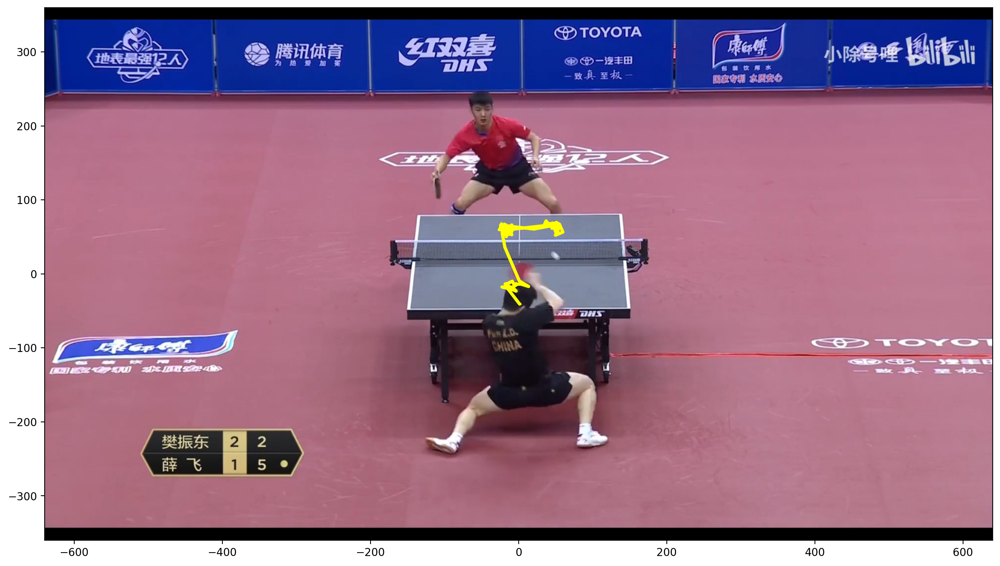

In [14]:
plt.figure(figsize=(16,9), dpi=200)
plt.plot(people_traj_df["Screen.x"][30:130], people_traj_df["Screen.y"][30:130], label="Eye", linewidth=3, c="yellow")
# plt.scatter(people_traj_df.iloc[0, :]["Screen.x"], people_traj_df.iloc[0, :]["Screen.y"], s=10, c="red")
# plt.scatter(people_traj_df.iloc[-1, :]["Screen.x"], people_traj_df.iloc[-1, :]["Screen.y"], s=10, c="yellow")

try:
    plt.imshow(img, extent=[-640, 640, -360, 360])
except:
    print("no gaming image")
# plt.legend( title="Gaze vs Ball\n (time order)", loc="lower left")

In [10]:
round_ball_traj = ball_traj_df[ball_traj_df["round"]==v_round]

match_rounds = json.load(open(os.path.join(FEA_DIR, f"{p_id}/match_rounds.json")))[v_id]
rounds = json.load(open(os.path.join(FEA_DIR, f"{p_id}/rounds.json")))[v_id]
aim_round_indices = match_rounds[str(v_round)]
round_people_traj = people_traj_df.loc[aim_round_indices, :]

FileNotFoundError: [Errno 2] No such file or directory: '/Users/timberzhang/Documents/Documents/2024-JustWatch/OutputRecord/GreedyNonScale/HC13_杨日/match_rounds.json'

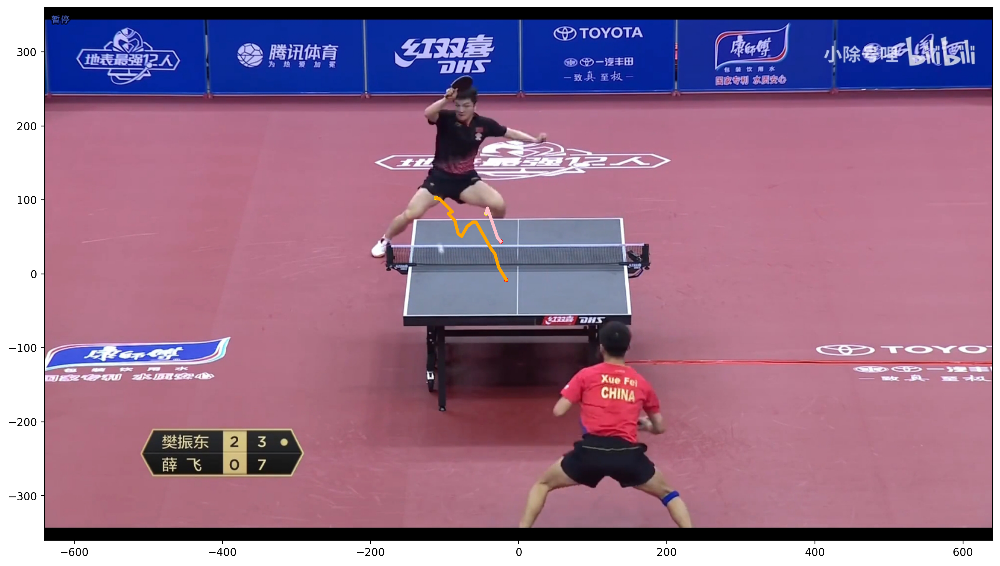

In [6]:
plt.figure(figsize=(16,9), dpi=200)
plt.plot(round_people_traj["Screen.x"], round_people_traj["Screen.y"], label="Eye", linewidth=3, c="pink")
plt.scatter(round_people_traj.iloc[0, :]["Screen.x"], round_people_traj.iloc[0, :]["Screen.y"], s=10, c="red")
plt.scatter(round_people_traj.iloc[-1, :]["Screen.x"], round_people_traj.iloc[-1, :]["Screen.y"], s=10, c="yellow")

# plt.plot(round_df["Ball.x"], round_df["Ball.y"], label="Ball Hit")
plt.plot(round_ball_traj["Ball.x"], round_ball_traj["Ball.y"], label="Ball Hit", linewidth=3, c="orange")
plt.scatter(round_ball_traj.iloc[0, :]["Ball.x"], round_ball_traj.iloc[0, :]["Ball.y"], s=10, c="red")
plt.scatter(round_ball_traj.iloc[-1, :]["Ball.x"], round_ball_traj.iloc[-1, :]["Ball.y"], s=10, c="yellow")

try:
    plt.imshow(img, extent=[-640, 640, -360, 360])
except:
    print("no gaming image")
# plt.legend( title="Gaze vs Ball\n (time order)", loc="lower left")

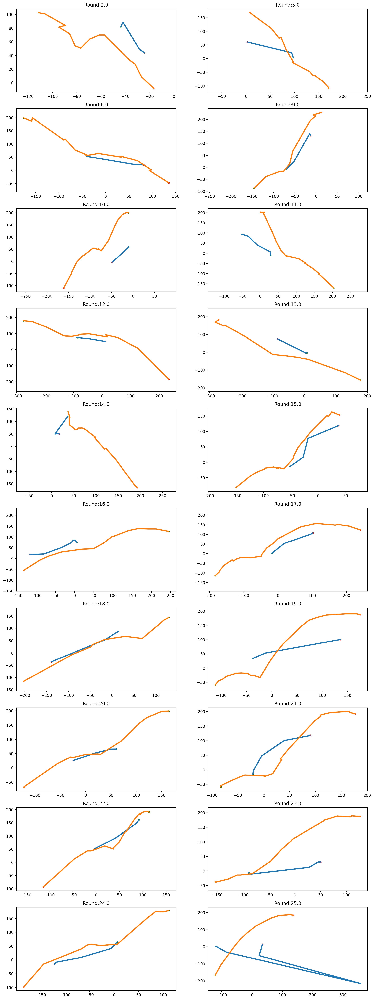

In [7]:
# plt.figure()
fig, ax=plt.subplots(nrows=int(np.ceil(len(match_rounds)/2)), ncols=2, figsize=(16,9*np.ceil(len(match_rounds.keys())/4)), dpi=200)

for idx, (round, round_indices) in enumerate(match_rounds.items()):
    _row = idx // 2
    _col = idx % 2
    
    round_ball_traj = ball_traj_df[ball_traj_df["round"]==float(round)]
    round_people_traj = people_traj_df.loc[round_indices, :]
    
    if len(match_rounds)>2:
        ax[_row, _col].plot(round_people_traj["Screen.x"], round_people_traj["Screen.y"], label="Eye", linewidth=3)
        ax[_row, _col].scatter(round_people_traj.iloc[0, :]["Screen.x"], round_people_traj.iloc[0, :]["Screen.y"], s=10, c="red")
        ax[_row, _col].scatter(round_people_traj.iloc[-1, :]["Screen.x"], round_people_traj.iloc[-1, :]["Screen.y"], s=10, c="green")

        # ax[_row, _col].plot(round_df["Ball.x"], round_df["Ball.y"], label="Ball Hit")
        ax[_row, _col].plot(round_ball_traj["Ball.x"], round_ball_traj["Ball.y"], label="Ball Hit", linewidth=3)
        ax[_row, _col].scatter(round_ball_traj.iloc[0, :]["Ball.x"], round_ball_traj.iloc[0, :]["Ball.y"], s=10, c="red")
        ax[_row, _col].scatter(round_ball_traj.iloc[-1, :]["Ball.x"], round_ball_traj.iloc[-1, :]["Ball.y"], s=10, c="green")

        # ax[_row, _col].imshow(img, extent=[-640, 640, -360, 360])
        # ax[_row, _col].set_xlim(-640, 640)
        # ax[_row, _col].set_ylim(-360, 360)
        ax[_row, _col].set_aspect(9/16, adjustable="datalim")
        # ax[_row, _col].legend( title="Gaze vs Ball\n (time order)", loc="lower left")
        # ax[_row, _col].set_title(f"Round:{round} : {round_dtw[round]}")
        ax[_row, _col].set_title(f"Round:{round}")
    else:
        ax[_col].plot(round_people_traj["Screen.x"], round_people_traj["Screen.y"], label="Eye")
        ax[_col].scatter(round_people_traj.iloc[0, :]["Screen.x"], round_people_traj.iloc[0, :]["Screen.y"], s=10, c="red")
        ax[_col].scatter(round_people_traj.iloc[-1, :]["Screen.x"], round_people_traj.iloc[-1, :]["Screen.y"], s=10, c="green")

        # ax[_col].plot(round_df["Ball.x"], round_df["Ball.y"], label="Ball Hit")
        ax[_col].plot(round_ball_traj["Ball.x"], round_ball_traj["Ball.y"], label="Ball Hit")
        ax[_col].scatter(round_ball_traj.iloc[0, :]["Ball.x"], round_ball_traj.iloc[0, :]["Ball.y"], s=10, c="red")
        ax[_col].scatter(round_ball_traj.iloc[-1, :]["Ball.x"], round_ball_traj.iloc[-1, :]["Ball.y"], s=10, c="green")

        ax[_col].imshow(img, extent=[-640, 640, -360, 360])
        # ax[_col].legend( title="Gaze vs Ball\n (time order)", loc="lower left")
        # ax[_col].set_title(f"Round:{round} : {round_dtw[round]}")
        ax[_col].set_title(f"Round:{round}")

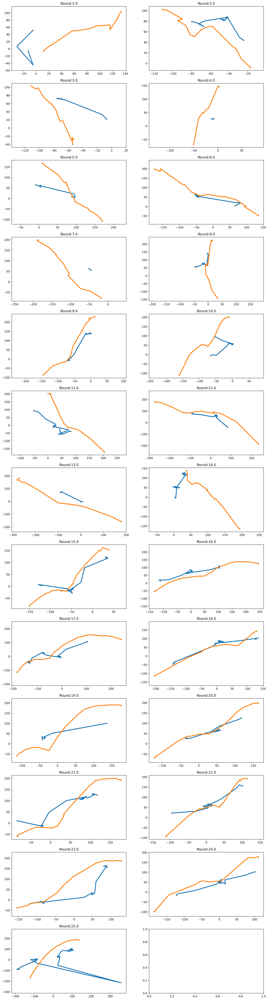

In [8]:
# plt.figure()
fig, ax=plt.subplots(nrows=int(np.ceil(len(rounds)/2)), ncols=2, figsize=(16,9*np.ceil(len(rounds.keys())/4)), dpi=200)

for idx, (round, round_indices) in enumerate(rounds.items()):
    _row = idx // 2
    _col = idx % 2
    
    round_ball_traj = ball_traj_df[ball_traj_df["round"]==float(round)]
    round_people_traj = people_traj_df.loc[round_indices, :]
    
    if len(rounds)>2:
        ax[_row, _col].plot(round_people_traj["Screen.x"], round_people_traj["Screen.y"], label="Eye", linewidth=3)
        ax[_row, _col].scatter(round_people_traj.iloc[0, :]["Screen.x"], round_people_traj.iloc[0, :]["Screen.y"], s=10, c="red")
        ax[_row, _col].scatter(round_people_traj.iloc[-1, :]["Screen.x"], round_people_traj.iloc[-1, :]["Screen.y"], s=10, c="green")

        # ax[_row, _col].plot(round_df["Ball.x"], round_df["Ball.y"], label="Ball Hit")
        ax[_row, _col].plot(round_ball_traj["Ball.x"], round_ball_traj["Ball.y"], label="Ball Hit", linewidth=3)
        ax[_row, _col].scatter(round_ball_traj.iloc[0, :]["Ball.x"], round_ball_traj.iloc[0, :]["Ball.y"], s=10, c="red")
        ax[_row, _col].scatter(round_ball_traj.iloc[-1, :]["Ball.x"], round_ball_traj.iloc[-1, :]["Ball.y"], s=10, c="green")

        # ax[_row, _col].imshow(img, extent=[-640, 640, -360, 360])
        ax[_row, _col].set_aspect(9/16, adjustable="datalim")
        # ax[_row, _col].set_xlim(-640, 640)
        # ax[_row, _col].set_ylim(-360, 360)
        # ax[_row, _col].legend( title="Gaze vs Ball\n (time order)", loc="lower left")
        # ax[_row, _col].set_title(f"Round:{round} : {round_dtw[round]}")
        ax[_row, _col].set_title(f"Round:{round}")
    else:
        ax[_col].plot(round_people_traj["Screen.x"], round_people_traj["Screen.y"], label="Eye")
        ax[_col].scatter(round_people_traj.iloc[0, :]["Screen.x"], round_people_traj.iloc[0, :]["Screen.y"], s=10, c="red")
        ax[_col].scatter(round_people_traj.iloc[-1, :]["Screen.x"], round_people_traj.iloc[-1, :]["Screen.y"], s=10, c="green")

        # ax[_col].plot(round_df["Ball.x"], round_df["Ball.y"], label="Ball Hit")
        ax[_col].plot(round_ball_traj["Ball.x"], round_ball_traj["Ball.y"], label="Ball Hit")
        ax[_col].scatter(round_ball_traj.iloc[0, :]["Ball.x"], round_ball_traj.iloc[0, :]["Ball.y"], s=10, c="red")
        ax[_col].scatter(round_ball_traj.iloc[-1, :]["Ball.x"], round_ball_traj.iloc[-1, :]["Ball.y"], s=10, c="green")

        # ax[_col].imshow(img, extent=[-640, 640, -360, 360])
        # ax[_col].legend( title="Gaze vs Ball\n (time order)", loc="lower left")
        # ax[_col].set_title(f"Round:{round} : {round_dtw[round]}")
        ax[_col].set_title(f"Round:{round}")

In [9]:
from Extractor.utils import compute_eye_move, max_circle_radius
from Extractor.TrajectoryFeatures import compute_two_traj_angle

match_rounds = {}
for _round, _round_index in rounds.items():
    temp_df = people_traj_df.loc[_round_index, :].copy()

    temp_df["sub_x"] = temp_df["Screen.x"]-temp_df["Screen.x"].shift(-1)
    temp_df["sub_y"] = temp_df["Screen.y"]-temp_df["Screen.y"].shift(-1)
    # temp_df["sub_x"] = np.round(temp_df["Screen.x"]-temp_df["Screen.x"].shift(-1))
    # temp_df["sub_y"] = np.round(temp_df["Screen.y"]-temp_df["Screen.y"].shift(-1))
    temp_indices = temp_df.index.to_list()

    ## search for where brake the line
    break_indices = []
    for i in range(1, len(temp_indices)):
        if temp_df.loc[temp_indices[i], "sub_x"] * temp_df.loc[temp_indices[i-1], "sub_x"] < 0:
            if temp_df.loc[temp_indices[i], "sub_y"] * temp_df.loc[temp_indices[i-1], "sub_y"] > 0:
                if abs(temp_df.loc[temp_indices[i-1], "sub_x"]) > 2:
                    break_indices.append(temp_indices[i])
            else:
                break_indices.append(temp_indices[i])
        if temp_df.loc[temp_indices[i], "sub_y"] * temp_df.loc[temp_indices[i-1], "sub_y"] < 0:
            if temp_df.loc[temp_indices[i], "sub_x"] * temp_df.loc[temp_indices[i-1], "sub_x"] > 0:
                if abs(temp_df.loc[temp_indices[i-1], "sub_y"]) > 2:
                    break_indices.append(temp_indices[i])
            else:
                break_indices.append(temp_indices[i])
    break_indices = list(set(break_indices))
    break_indices.sort()

    ## use max length of single direction line
    max_dist = -1
    _indices = []
    for idx, end_index in enumerate(break_indices):
        if idx==0:
            start_index=temp_indices[0]
        else:
            start_index=break_indices[idx-1]
        dist = compute_eye_move(temp_df.loc[start_index:end_index])
        if dist > max_dist:
            max_dist = dist
            _indices = temp_df.loc[start_index:end_index].index.to_list()

    if len(_indices)==0: continue
    # test if the line is longer enough
    max_dist = max_circle_radius(temp_df.loc[_indices, :]) * 2
    # test if the angle match
    angle = compute_two_traj_angle(
        eye_traj=temp_df.loc[_indices, ["Screen.x", "Screen.y"]].copy(),
        ball_traj=ball_traj_df[ball_traj_df["round"]==float(_round)].copy()
    )
    if max_dist >= 58 and angle <= 60:
        match_rounds[_round] = _indices

In [10]:
match_rounds

{'2.0': [60, 61, 62],
 '5.0': [148, 149, 150, 151, 152],
 '6.0': [164, 165, 166, 167, 168, 169],
 '8.0': [241, 242],
 '9.0': [253, 254, 255, 256],
 '10.0': [276, 277],
 '11.0': [305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317],
 '12.0': [339, 340],
 '13.0': [389, 390, 391, 392, 393, 394],
 '14.0': [423, 424, 425, 426, 427, 428, 429],
 '15.0': [441, 442, 443, 444],
 '16.0': [478, 479, 480, 481, 482, 483, 484],
 '17.0': [502, 503, 504, 505, 506],
 '18.0': [551, 552, 553],
 '19.0': [586, 587, 588],
 '20.0': [631, 632, 633, 634, 635],
 '21.0': [662, 663, 664, 665, 666, 667],
 '22.0': [703, 704, 705, 706],
 '23.0': [724, 725, 726, 727, 728],
 '24.0': [745, 746, 747, 748, 749, 750],
 '25.0': [782, 783, 784, 785, 786, 787, 788, 789, 790]}

In [11]:
test = people_traj_df.loc[match_rounds["8.0"], :]

test["sub_x"] = test["Screen.x"]-test["Screen.x"].shift(-1)
test["sub_y"] = test["Screen.y"]-test["Screen.y"].shift(-1)
test

,Screen.x,Screen.y,LeftPupil,RightPupil,frame,sub_x,sub_y
241,-4.907347,65.78363,4.022349,3.364367,241,-5.294338,-69.35277
242,0.386991,135.13640,4.246753,3.289331,242,NaN,NaN


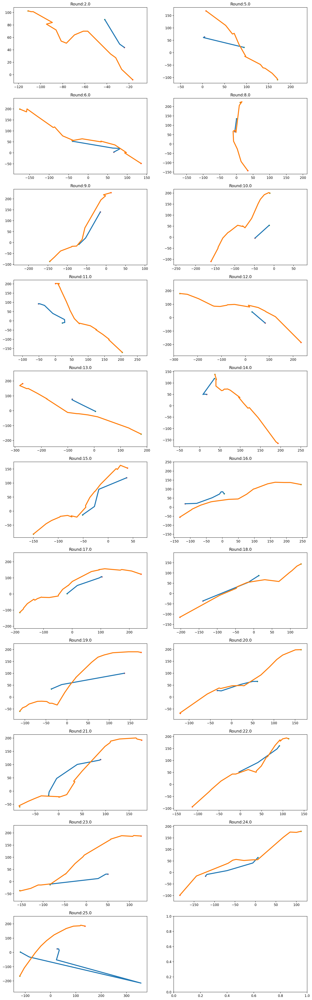

In [12]:
# plt.figure()
fig, ax=plt.subplots(nrows=int(np.ceil(len(match_rounds)/2)), ncols=2, figsize=(16,9*np.ceil(len(match_rounds.keys())/4)), dpi=200)

for idx, (round, round_indices) in enumerate(match_rounds.items()):
    _row = idx // 2
    _col = idx % 2
    
    round_ball_traj = ball_traj_df[ball_traj_df["round"]==float(round)]
    round_people_traj = people_traj_df.loc[round_indices, :]
    
    if len(match_rounds)>2:
        ax[_row, _col].plot(round_people_traj["Screen.x"], round_people_traj["Screen.y"], label="Eye", linewidth=3)
        ax[_row, _col].scatter(round_people_traj.iloc[0, :]["Screen.x"], round_people_traj.iloc[0, :]["Screen.y"], s=10, c="red")
        ax[_row, _col].scatter(round_people_traj.iloc[-1, :]["Screen.x"], round_people_traj.iloc[-1, :]["Screen.y"], s=10, c="green")

        # ax[_row, _col].plot(round_df["Ball.x"], round_df["Ball.y"], label="Ball Hit")
        ax[_row, _col].plot(round_ball_traj["Ball.x"], round_ball_traj["Ball.y"], label="Ball Hit", linewidth=3)
        ax[_row, _col].scatter(round_ball_traj.iloc[0, :]["Ball.x"], round_ball_traj.iloc[0, :]["Ball.y"], s=10, c="red")
        ax[_row, _col].scatter(round_ball_traj.iloc[-1, :]["Ball.x"], round_ball_traj.iloc[-1, :]["Ball.y"], s=10, c="green")

        # ax[_row, _col].imshow(img, extent=[-640, 640, -360, 360])
        # ax[_row, _col].set_xlim(-640, 640)
        # ax[_row, _col].set_ylim(-360, 360)
        ax[_row, _col].set_aspect(9/16, adjustable="datalim")
        # ax[_row, _col].legend( title="Gaze vs Ball\n (time order)", loc="lower left")
        # ax[_row, _col].set_title(f"Round:{round} : {round_dtw[round]}")
        ax[_row, _col].set_title(f"Round:{round}")
    else:
        ax[_col].plot(round_people_traj["Screen.x"], round_people_traj["Screen.y"], label="Eye")
        ax[_col].scatter(round_people_traj.iloc[0, :]["Screen.x"], round_people_traj.iloc[0, :]["Screen.y"], s=10, c="red")
        ax[_col].scatter(round_people_traj.iloc[-1, :]["Screen.x"], round_people_traj.iloc[-1, :]["Screen.y"], s=10, c="green")

        # ax[_col].plot(round_df["Ball.x"], round_df["Ball.y"], label="Ball Hit")
        ax[_col].plot(round_ball_traj["Ball.x"], round_ball_traj["Ball.y"], label="Ball Hit")
        ax[_col].scatter(round_ball_traj.iloc[0, :]["Ball.x"], round_ball_traj.iloc[0, :]["Ball.y"], s=10, c="red")
        ax[_col].scatter(round_ball_traj.iloc[-1, :]["Ball.x"], round_ball_traj.iloc[-1, :]["Ball.y"], s=10, c="green")

        ax[_col].imshow(img, extent=[-640, 640, -360, 360])
        # ax[_col].legend( title="Gaze vs Ball\n (time order)", loc="lower left")
        # ax[_col].set_title(f"Round:{round} : {round_dtw[round]}")
        ax[_col].set_title(f"Round:{round}")

# For Clustering

In [43]:
import json
import os
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['font.size'] = 14
from PIL import Image
from config import *

In [44]:
p_id = "HC14_池海燕"
v_id = "p5_0_0_1"
fea_output = "/Users/timberzhang/Documents/Project/2024-JustWatch/FrontNeuro/OutputRecords/Emo-20241225"


# Load the background image
background_image = np.array(Image.open(os.path.join(DATA_DIR, "GamingPics/p5.png")))

In [45]:
from load_data import fetch_data
people_traj = fetch_data(DATA_DIR, [f"Participant_Video_csv/{p_id}.csv"])[p_id][v_id]
people_traj_df = pd.DataFrame(people_traj).T
people_traj_df["frame"] = people_traj_df.index
people_traj_df.ffill(inplace=True)

## Draw HeatMap

In [46]:
from Extractor.WholeGameFeatures import compute_distmap
eye_dist = compute_distmap(people_traj_df.loc[:,["Screen.x", "Screen.y"]].to_numpy())

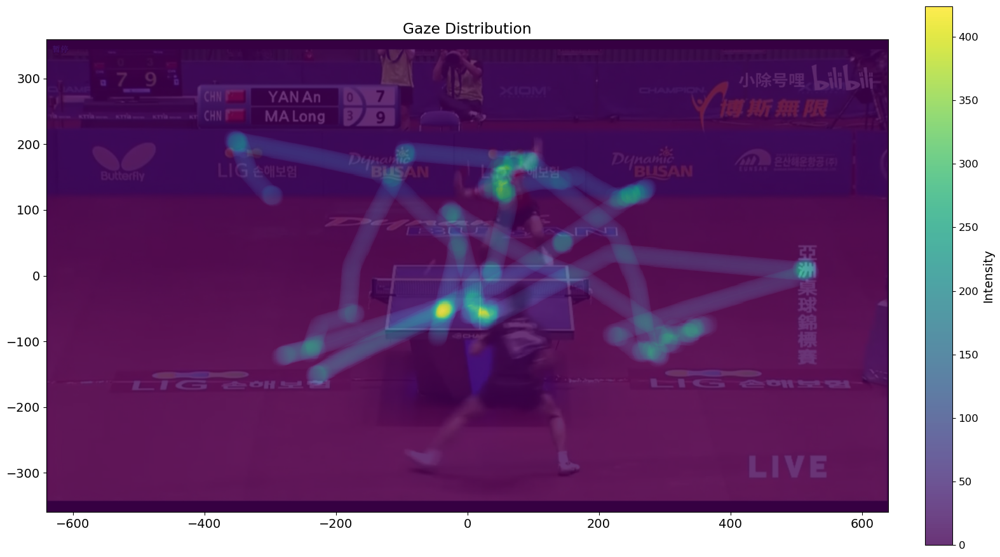

In [55]:
from matplotlib.colors import Normalize

fig, ax = plt.subplots(figsize=(16, 9))

ax.imshow(background_image, extent=[-640, 640, -360, 360], aspect='auto')

cax = ax.imshow(
    np.flipud(eye_dist), 
    cmap='viridis',
    alpha=0.8,
    interpolation='nearest', 
    extent=[-640, 640, -360, 360],
    norm=Normalize(vmin=eye_dist.min(), vmax=eye_dist.max())
    )
# plt.colorbar(label="Intensity")
cbar = fig.colorbar(cax, ax=ax, fraction=0.05, pad=0.04)
cbar.ax.tick_params(labelsize=12)                     # Colorbar tick font size
cbar.set_label('Intensity', fontsize=14)         # Colorbar label font size

# Customize layout to emphasize the heatmap
plt.tight_layout()
# Show the plot
plt.title("Gaze Distribution")
plt.show()


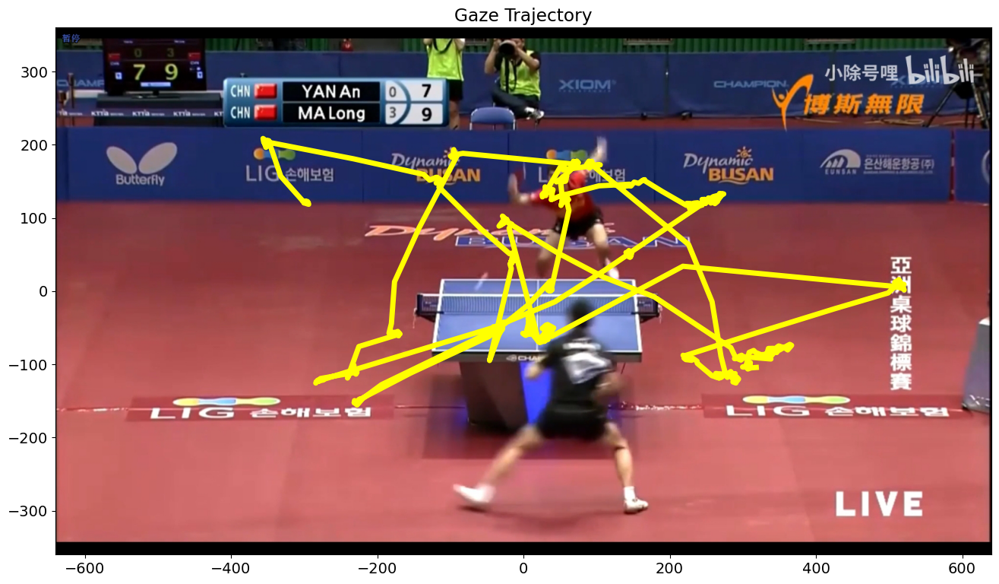

In [60]:
plt.figure(figsize=(16,9))
plt.plot(people_traj_df["Screen.x"], people_traj_df["Screen.y"], label="Eye", linewidth=5, c="yellow")
# plt.scatter(people_traj_df.iloc[0, :]["Screen.x"], people_traj_df.iloc[0, :]["Screen.y"], s=10, c="red")
# plt.scatter(people_traj_df.iloc[-1, :]["Screen.x"], people_traj_df.iloc[-1, :]["Screen.y"], s=10, c="yellow")

try:
    plt.imshow(background_image, extent=[-640, 640, -360, 360])
except:
    print("no gaming image")
# plt.legend( title="Gaze vs Ball\n (time order)", loc="lower left")
plt.title("Gaze Trajectory")
plt.show()

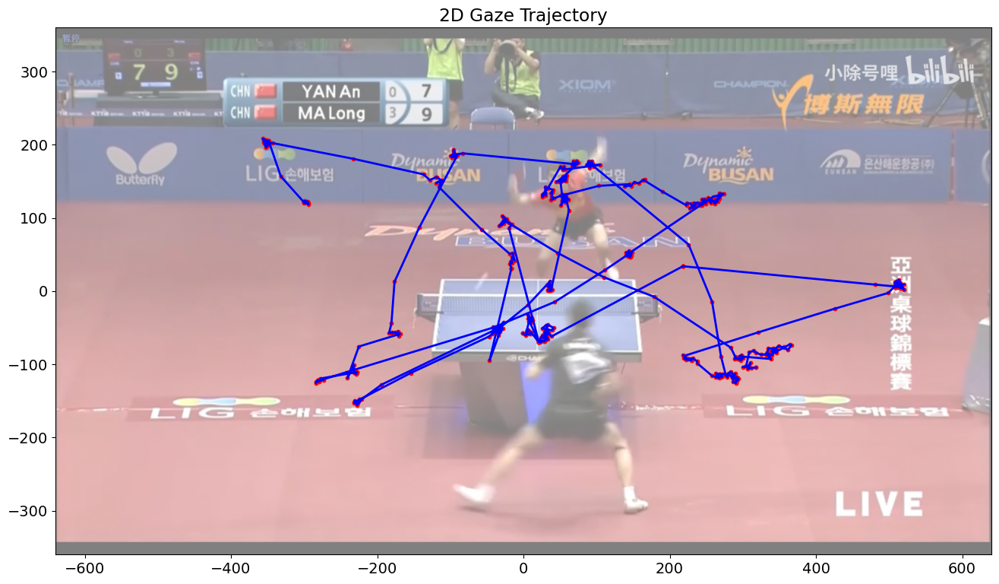

In [102]:
plt.figure(figsize=(16,9))
plt.scatter(people_traj_df["Screen.x"], people_traj_df["Screen.y"], s=10, c="red")
plt.plot(people_traj_df["Screen.x"], people_traj_df["Screen.y"], label="Eye", linewidth=2, c="blue")
# plt.scatter(people_traj_df.iloc[-1, :]["Screen.x"], people_traj_df.iloc[-1, :]["Screen.y"], s=10, c="yellow")

try:
    plt.imshow(background_image, extent=[-640, 640, -360, 360], alpha=0.5)
except:
    print("no gaming image")
# plt.legend( title="Gaze vs Ball\n (time order)", loc="lower left")
plt.xlim(-640, 640)
plt.ylim(-360, 360)
plt.title("2D Gaze Trajectory")
plt.show()

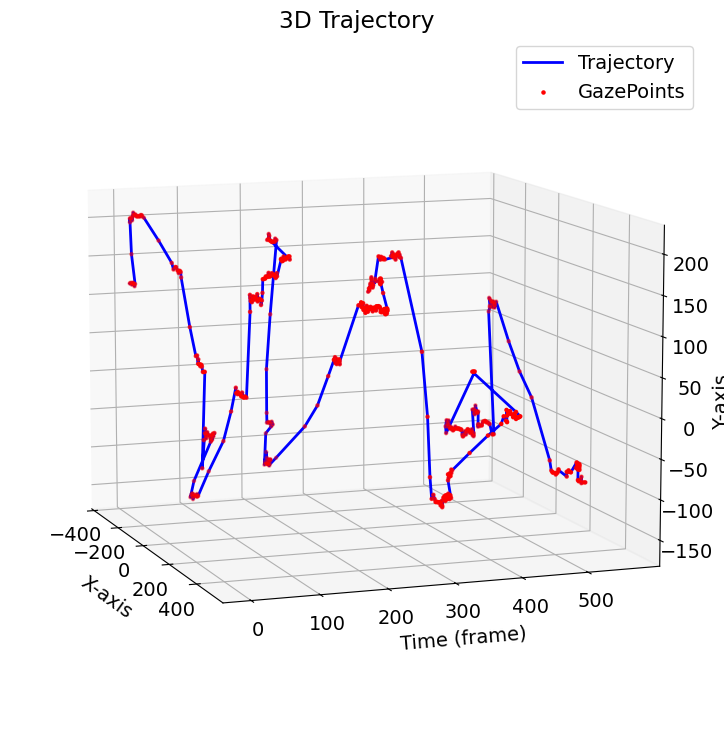

In [100]:
# Example trajectory data
t = people_traj_df["Screen.y"] 
x = people_traj_df["Screen.x"]
y = people_traj_df["frame"]

# Create a 3D plot
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(111, projection='3d')

# Plot the trajectory
ax.plot(x, y, t, label='Trajectory', color='blue', linewidth=2)
ax.scatter(x, y, t, label='GazePoints', color='red', s=5)

# Add labels and title
ax.set_xlabel('\nX-axis')
ax.set_ylabel('\nTime (frame)')
ax.set_zlabel('Y-axis')
ax.set_title('3D Trajectory')

ax.view_init(elev=10., azim=-20, roll=0)
# ax.view_init(elev=30, azim=45)
# Show the legend
ax.legend()
# Show the plot
plt.show()

In [109]:
from sklearn.cluster import DBSCAN
from random import random

temp = np.array([people_traj_df["Screen.x"], people_traj_df["Screen.y"], people_traj_df["frame"]]).T
temp = pd.DataFrame(temp)
db = DBSCAN(eps=CLUSTER_MIN_EPS, min_samples=CLUSTER_MIN_SAMPLE)
cluster_res = db.fit(temp.dropna())
classes = pd.value_counts(cluster_res.labels_).index

color_dict = {c:(random(), random(), random()) for c in classes}
temp["c"] = cluster_res.labels_
temp["color"] = temp["c"].map(color_dict)

,0,1,2,c,color
0,-300.7747,121.94000,1.0,0,"(0.5527502684362101, 0.8287970216076419, 0.695..."
1,-299.8898,122.82760,2.0,0,"(0.5527502684362101, 0.8287970216076419, 0.695..."
2,-294.2375,120.77280,3.0,0,"(0.5527502684362101, 0.8287970216076419, 0.695..."
3,-295.5569,122.39410,4.0,0,"(0.5527502684362101, 0.8287970216076419, 0.695..."
4,-299.3320,122.89470,5.0,0,"(0.5527502684362101, 0.8287970216076419, 0.695..."
...,...,...,...,...,...
564,310.2787,-97.86325,565.0,29,"(0.4804589374773698, 0.3399111130696181, 0.464..."
565,306.7487,-106.44950,566.0,29,"(0.4804589374773698, 0.3399111130696181, 0.464..."
566,311.2092,-104.91290,567.0,29,"(0.4804589374773698, 0.3399111130696181, 0.464..."
567,318.2791,-104.36970,568.0,29,"(0.4804589374773698, 0.3399111130696181, 0.464..."


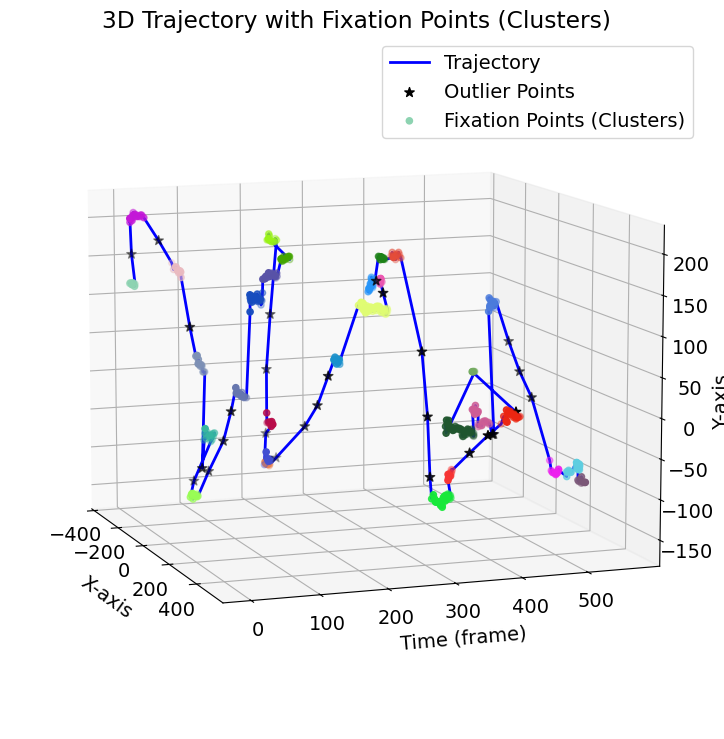

In [147]:
# Example trajectory data
t = people_traj_df["Screen.y"] 
x = people_traj_df["Screen.x"]
y = people_traj_df["frame"]

# Create a 3D plot
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(111, projection='3d')

# Plot the trajectory
ax.plot(x, y, t, label='Trajectory', color='blue', linewidth=2)
for idx, cluster in temp.groupby(by="c"):
    # if idx>5: continue
    # label = ("Noisy") if idx==-1 else f"Gaze {idx}"
    if idx==-1:
        ax.scatter( cluster[0], cluster[2], cluster[1], c="black", marker="*", label="Outlier Points", s=50)
    else:
        if idx==0:
            ax.scatter( cluster[0], cluster[2], cluster[1], c=cluster["color"], label="Fixation Points (Clusters)")
        else:
            ax.scatter( cluster[0], cluster[2], cluster[1], c=cluster["color"])

# Add labels and title
ax.set_xlabel('\nX-axis')
ax.set_ylabel('\nTime (frame)')
ax.set_zlabel('Y-axis')
ax.set_title('3D Trajectory with Fixation Points (Clusters)')

ax.view_init(elev=10., azim=-20, roll=0)
# ax.view_init(elev=30, azim=45)
# Show the legend
ax.legend()
# Show the plot
plt.show()

In [1]:
a = [0.04,
0.88,
0.15,
0.01,
0.01,
0.13,
0.46,
0.14,
0.15,
1.0,
0.03,
0.27,
0.19,
0.28,]

In [2]:
ranked_a = sorted(a)

In [3]:
ranked_a

[0.01,
 0.01,
 0.03,
 0.04,
 0.13,
 0.14,
 0.15,
 0.15,
 0.19,
 0.27,
 0.28,
 0.46,
 0.88,
 1.0]

In [8]:
aa = []
for idx, i in enumerate(ranked_a):
    aa.append(((idx+1)*0.05)/len(a))

In [9]:
aa

[0.0035714285714285718,
 0.0071428571428571435,
 0.010714285714285716,
 0.014285714285714287,
 0.017857142857142856,
 0.021428571428571432,
 0.025,
 0.028571428571428574,
 0.03214285714285715,
 0.03571428571428571,
 0.03928571428571429,
 0.042857142857142864,
 0.04642857142857143,
 0.05]

In [10]:
import random

for _ in range(4):
    print( 0.9373 + random.uniform(-0.008, 0.002))

0.932707703347567
0.9379137843182193
0.9385199417769577
0.9337265252692778


In [15]:
a = [[0.9381,0.9327],
[0.9372,0.9379],
[0.9391,0.9337],
[0.9367,0.9385],
[0.9382,0.9373]
]

for p in a:
    print(2 * (p[0] * p[1]) / (p[0] + p[1]))

0.9353922065426555
0.9375498693403018
0.9363922148654421
0.9375991360921502
0.9377497840575847
